#linear regression
step1:check linearity
step2:check for multicollinirity(check columns related to each otherx1~x2)
step3:Subset selection to find which column to drop if multicollinirity is present
step4:model validation(q-q plot,erros vs fiited values)
step5:model deletion dignostic(calculation of cook's distance)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize']=(10,5)
plt.rcParams['figure.dpi']=300
sns.set_style('darkgrid')
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/aishwaryamate/Datasets/main/Cars.csv')
df

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
76,322,36.900000,50,169.598513,16.132947
77,238,19.197888,115,150.576579,37.923113
78,263,34.000000,50,151.598513,15.769625
79,295,19.833733,119,167.944460,39.423099


In [3]:
df.describe()

,HP,MPG,VOL,SP,WT
count,81.000000,81.000000,81.000000,81.000000,81.000000
mean,117.469136,34.422076,98.765432,121.540272,32.412577
std,57.113502,9.131445,22.301497,14.181432,7.492813
min,49.000000,12.101263,50.000000,99.564907,15.712859
25%,84.000000,27.856252,89.000000,113.829145,29.591768
50%,100.000000,35.152727,101.000000,118.208698,32.734518
75%,140.000000,39.531633,113.000000,126.404312,37.392524
max,322.000000,53.700681,160.000000,169.598513,52.997752


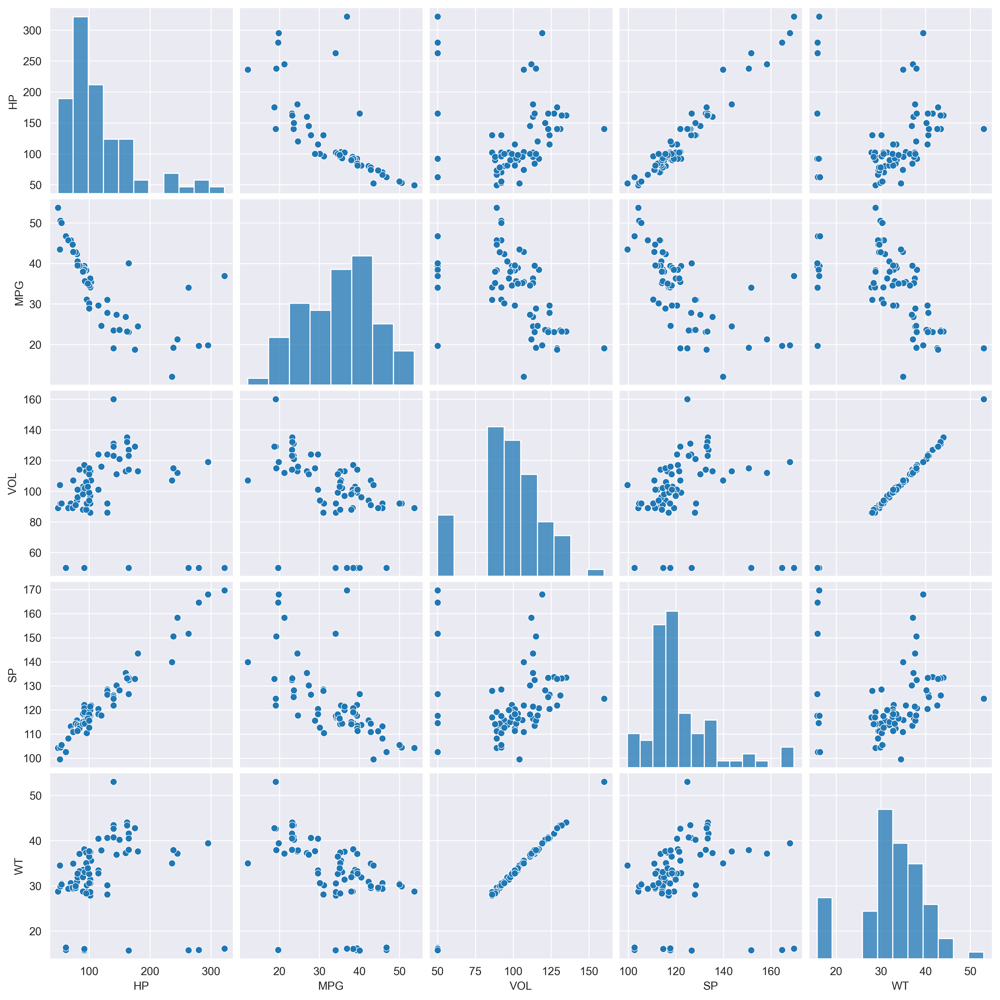

In [4]:
sns.pairplot(df)

<Axes: >

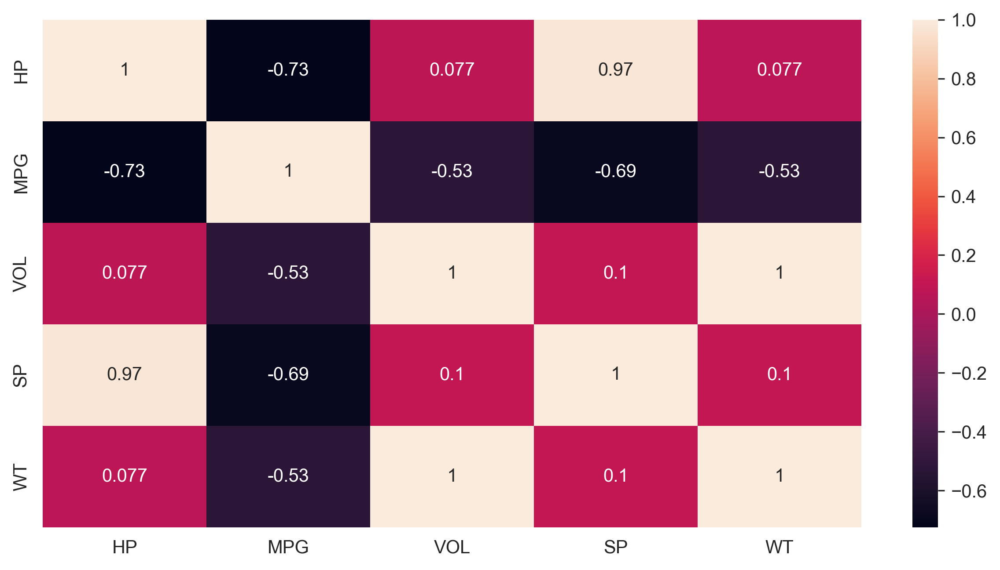

In [5]:
sns.heatmap(df.corr(),annot=True)

# model building

In [6]:
import statsmodels.formula.api as smf

In [7]:
model=smf.ols('MPG~HP+VOL+SP+WT',data=df).fit()

In [8]:
#hp<alpha=0.05,vol>alpha,sp<alpha,wt>alpha
"""(beacause of multicoliniarty between wt and vol 
both are not related now we have to remove one vol or wt)
hp<alpha=0.05,
- vol>alpha,
sp<alpha,
- wt>alpha"""
model.pvalues.round(2)

Intercept    0.04
HP           0.00
VOL          0.56
SP           0.01
WT           0.81
dtype: float64

In [9]:
wt=smf.ols('MPG~HP+SP+WT',data=df).fit()
wt.pvalues.round(2)

Intercept    0.05
HP           0.00
SP           0.01
WT           0.00
dtype: float64

In [10]:
vol=smf.ols('MPG~HP+SP+VOL',data=df).fit()
vol.pvalues.round(2)

Intercept    0.04
HP           0.00
SP           0.01
VOL          0.00
dtype: float64

# calculate VIF

In [11]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [12]:
df.head()

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149


In [13]:
data=df.drop(columns=['MPG'])

In [14]:
data.head()

,HP,VOL,SP,WT
0,49,89,104.185353,28.762059
1,55,92,105.461264,30.466833
2,55,92,105.461264,30.193597
3,70,92,113.461264,30.632114
4,53,92,104.461264,29.889149


In [18]:
data.values

array([[ 49.        ,  89.        , 104.1853528 ,  28.7620589 ],
       [ 55.        ,  92.        , 105.4612635 ,  30.46683298],
       [ 55.        ,  92.        , 105.4612635 ,  30.19359657],
       [ 70.        ,  92.        , 113.4612635 ,  30.63211391],
       [ 53.        ,  92.        , 104.4612635 ,  29.88914864],
       [ 70.        ,  89.        , 113.1853528 ,  29.59176832],
       [ 55.        ,  92.        , 105.4612635 ,  30.30847957],
       [ 62.        ,  50.        , 102.5985128 ,  15.84775807],
       [ 62.        ,  50.        , 102.5985128 ,  16.35948352],
       [ 80.        ,  94.        , 115.6452041 ,  30.92015417],
       [ 73.        ,  89.        , 111.1853528 ,  29.36334142],
       [ 92.        ,  50.        , 117.5985128 ,  15.75353468],
       [ 92.        ,  99.        , 122.1050553 ,  32.81359241],
       [ 73.        ,  89.        , 111.1853528 ,  29.3784363 ],
       [ 66.        ,  89.        , 108.1853528 ,  29.34727902],
       [ 73.        ,  89

In [19]:
vif=pd.DataFrame()
vif

""


In [20]:
vif['Feature']=data.columns
vif

,Feature
0,HP
1,VOL
2,SP
3,WT


In [21]:
range(len(data.columns))

range(0, 4)

In [22]:
vif['VIF']=[variance_inflation_factor(data.values,i)for i in range(len(data.columns))]

In [23]:
vif

,Feature,VIF
0,HP,11.191296
1,VOL,12708.789369
2,SP,50.541968
3,WT,12172.827328


# subset selection (to find which to choose VOL or WT)

In [24]:
wt.rsquared,wt.aic

(0.7694828139983458, 476.29927501529767)

In [25]:
vol.rsquared,vol.aic

(0.770368341321302, 475.9875158854609)

- Rsquared value of VOL is higher than WT so we choose VOL
- AIC value of VOL is less than WT so we choose VOL

# model validation

In [26]:
model=smf.ols('MPG~HP+VOL+SP',data=df).fit()
model

# 1.Residual Analysis

# Q-Q plot
To check normality of errors

In [27]:
import statsmodels.api as sm

In [28]:
model.resid

0     10.109912
1      7.756607
2      7.756607
3      3.334825
4      8.234688
        ...    
76    15.666857
77     1.330162
78     7.783144
79     7.596179
80    -3.491695
Length: 81, dtype: float64

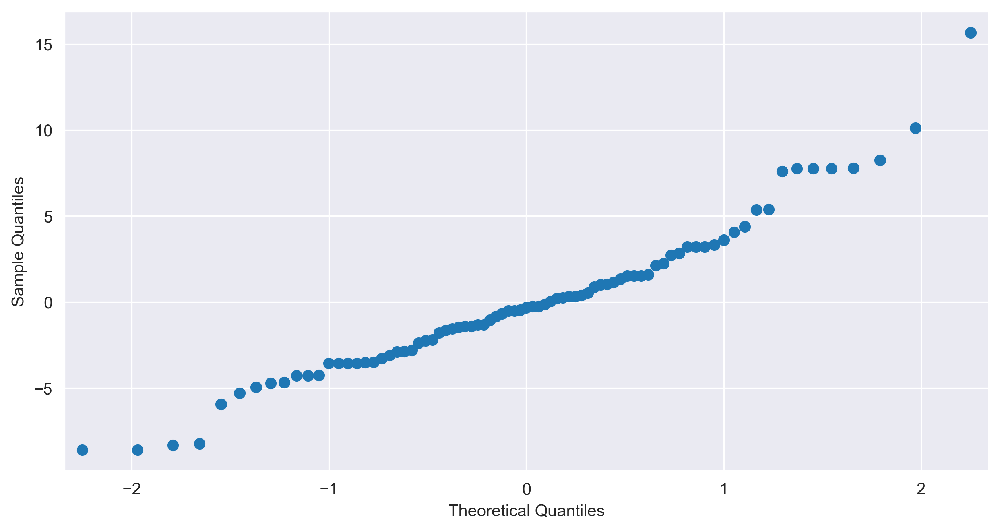

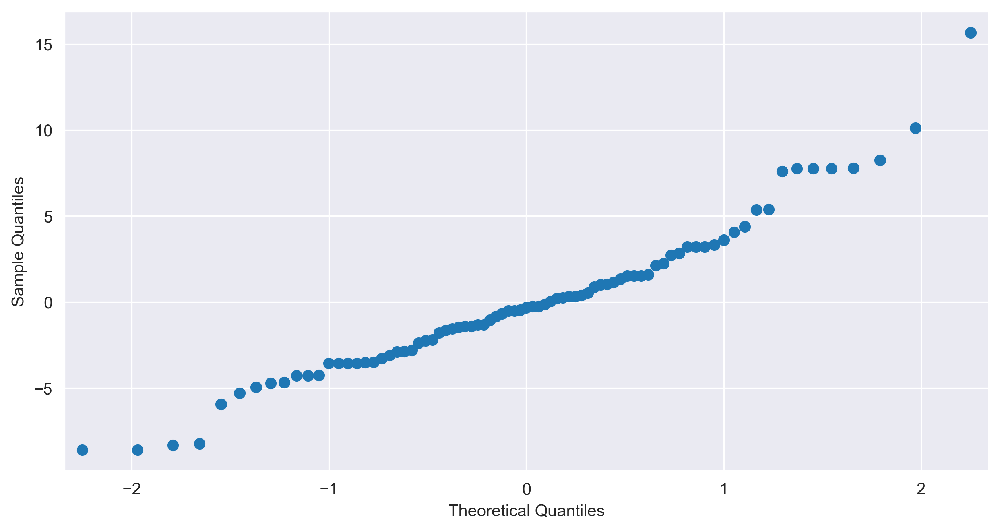

In [29]:
sm.qqplot(model.resid)

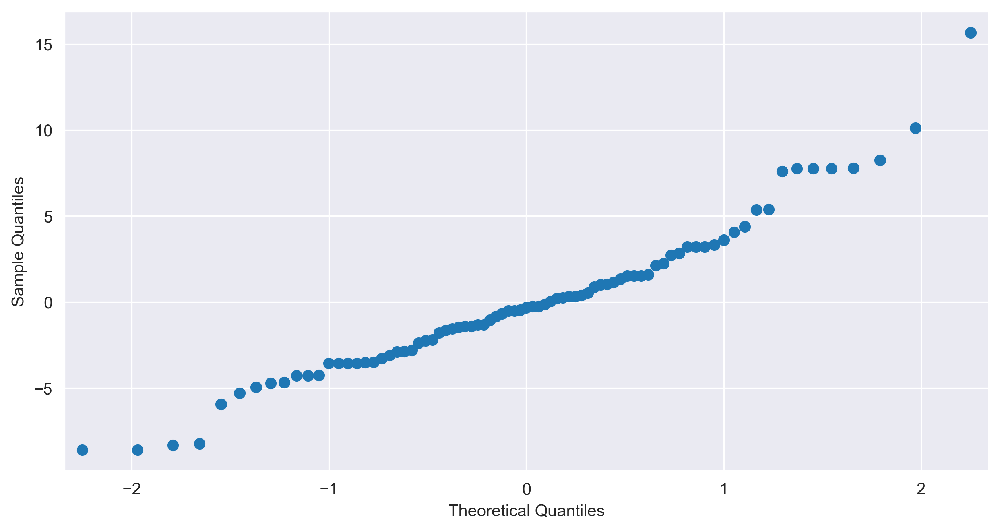

In [30]:
sm.qqplot(model.resid);

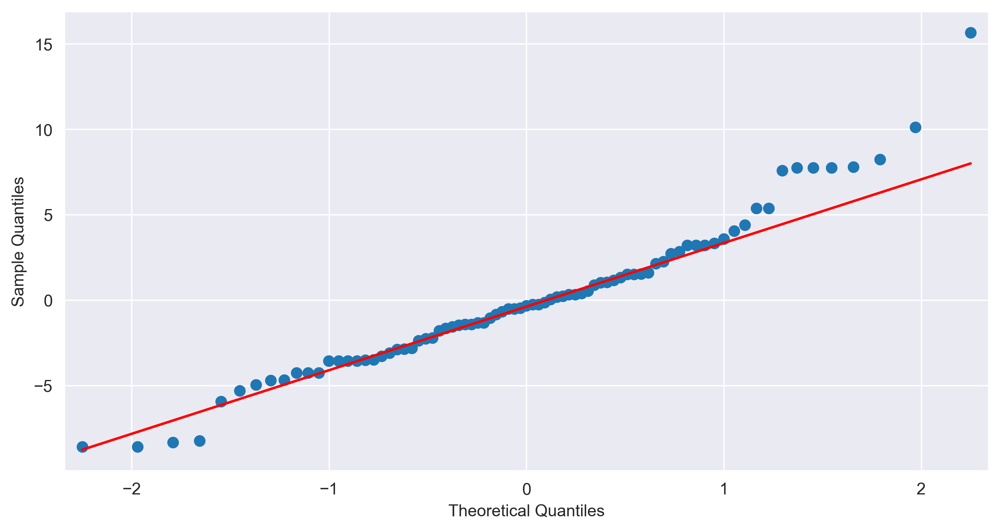

In [31]:
sm.qqplot(model.resid,line='q');

In [32]:
#get index number for higher residuals

In [33]:
np.argmax(model.resid), np.max(model.resid)

(76, 15.666857402852127)

# 2. Residual plot of homoscedasticity
To check to check if there is any pattern

In [34]:
model.fittedvalues,model.resid

(0     43.590769
 1     42.256794
 2     42.256794
 3     42.361497
 4     42.269544
         ...    
 76    21.233143
 77    17.867725
 78    26.216856
 79    12.237554
 80    15.592958
 Length: 81, dtype: float64,
 0     10.109912
 1      7.756607
 2      7.756607
 3      3.334825
 4      8.234688
         ...    
 76    15.666857
 77     1.330162
 78     7.783144
 79     7.596179
 80    -3.491695
 Length: 81, dtype: float64)

<Axes: >

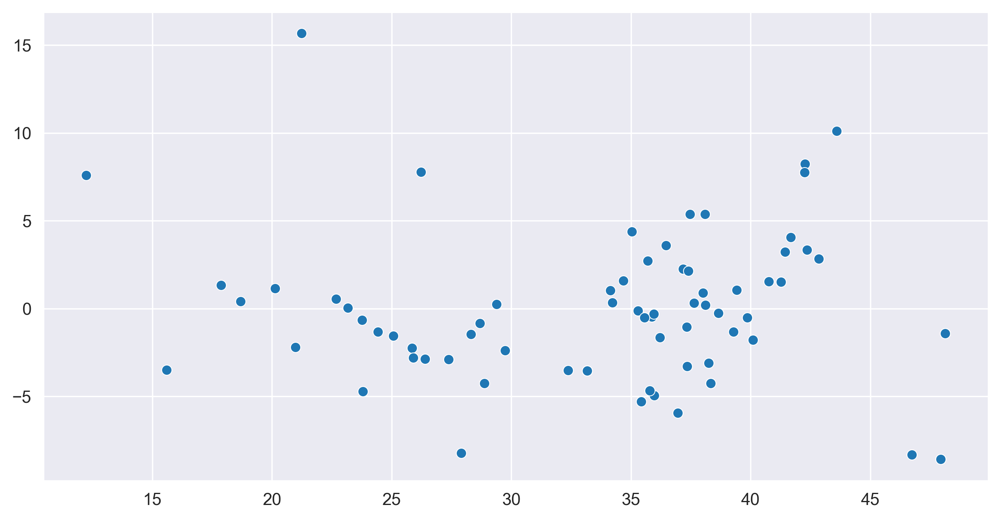

In [35]:
sns.scatterplot(x=model.fittedvalues,y=model.resid)

# 3.Residual vs Regressor
Weather erros are independent of our features

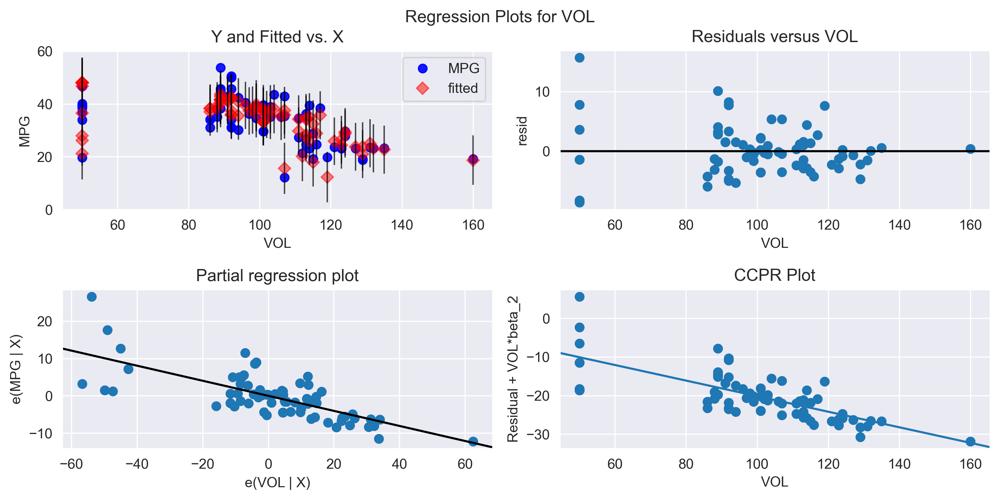

In [36]:
#Vol
sm.graphics.plot_regress_exog(model,'VOL');

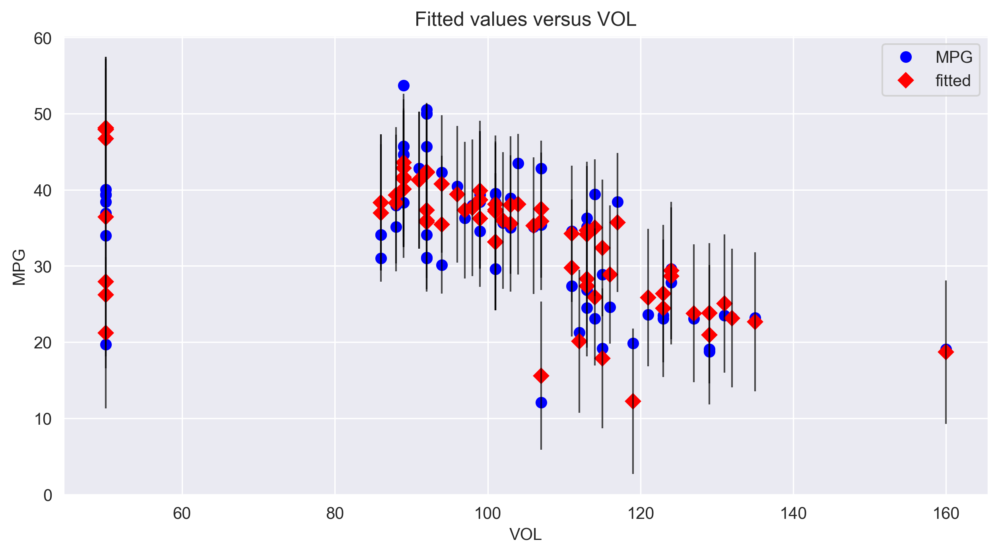

In [37]:
sm.graphics.plot_fit(model,'VOL');

In [38]:
df.dtypes

HP       int64
MPG    float64
VOL      int64
SP     float64
WT     float64
dtype: object

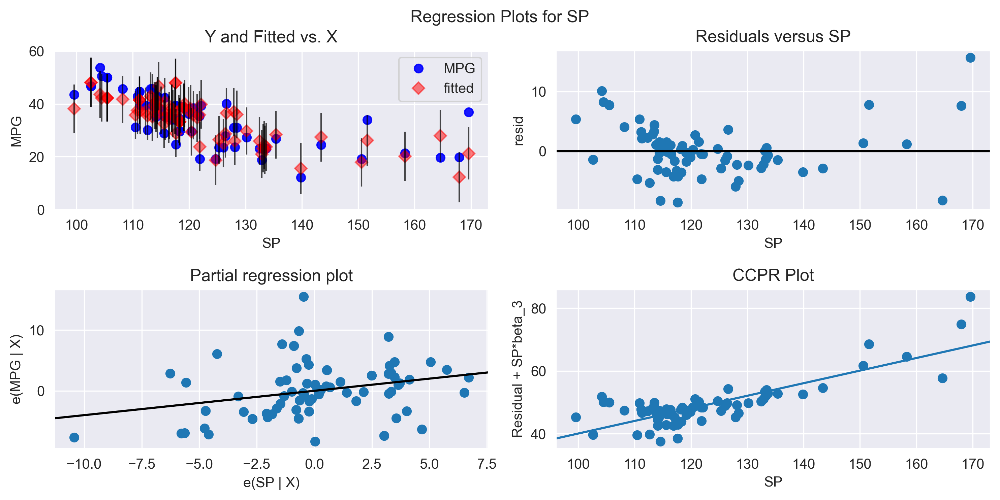

In [39]:
#Sp
sm.graphics.plot_regress_exog(model,'SP');

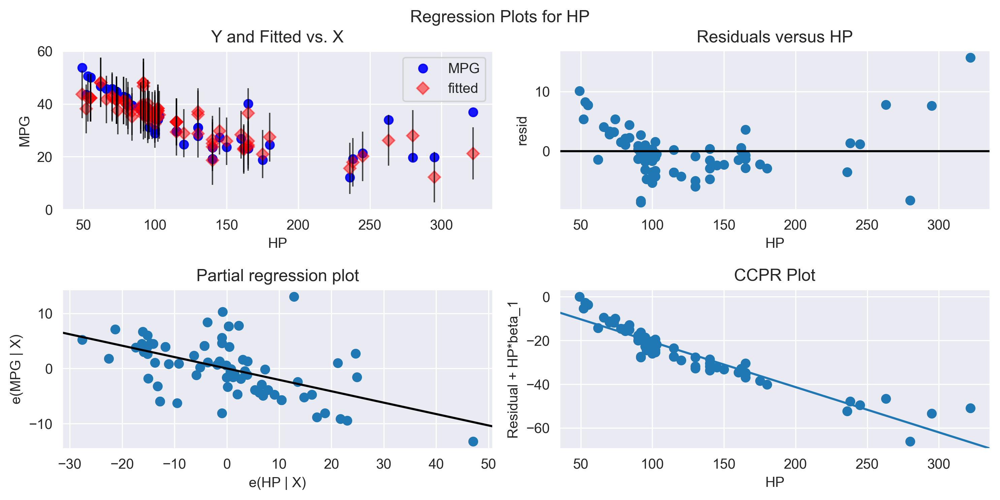

In [40]:
#Hp
sm.graphics.plot_regress_exog(model,'HP');

# Model deletion techniques

# Cook's Distance
- detection influencers and outliers

In [41]:
#find the influence data
inf=model.get_influence()

#calculate the cooks distance
c,p=inf.cooks_distance

In [42]:
#cooks distance
c

array([4.43781421e-02, 2.31439849e-02, 2.31439849e-02, 5.50743307e-03,
       2.84029117e-02, 3.89961849e-03, 2.31439849e-02, 3.39659293e-03,
       3.39659293e-03, 9.67532550e-04, 3.00465895e-03, 9.32152031e-02,
       2.65177317e-04, 3.00465895e-03, 5.41784561e-03, 3.00465895e-03,
       8.22731925e-04, 9.32152031e-02, 8.22731925e-04, 3.21833541e-04,
       2.70620733e-05, 8.34770054e-03, 1.83348025e-05, 2.72860299e-04,
       1.23307010e-03, 7.41312614e-02, 5.71759163e-03, 2.70620733e-05,
       3.33387970e-02, 9.21393948e-05, 5.93913831e-03, 1.23367282e-03,
       2.67864467e-04, 1.10555542e-03, 1.21312479e-03, 2.01774924e-05,
       4.19374936e-04, 4.18657710e-03, 4.18657710e-03, 1.12077324e-02,
       2.70424384e-04, 3.80042521e-06, 1.99290460e-03, 2.64674273e-03,
       2.22196543e-05, 4.76293133e-04, 2.58868946e-05, 4.92204073e-05,
       1.55796817e-02, 3.53143210e-03, 3.53143210e-03, 3.53143210e-03,
       2.30754944e-05, 1.04055062e-02, 1.07199598e-03, 2.89811901e-04,
      

In [43]:
#pvalue
p

array([0.9962016 , 0.99893591, 0.99893591, 0.99993824, 0.9984091 ,
       0.99996897, 0.99893591, 0.99997644, 0.99997644, 0.99999808,
       0.99998155, 0.98433513, 0.99999986, 0.99998155, 0.99994022,
       0.99998155, 0.99999861, 0.98433513, 0.99999861, 0.99999979,
       1.        , 0.99985867, 1.        , 0.99999985, 0.99999689,
       0.9898288 , 0.99993346, 1.        , 0.99782314, 0.99999998,
       0.99992822, 0.99999688, 0.99999985, 0.9999975 , 0.99999699,
       1.        , 0.99999964, 0.99996425, 0.99996425, 0.99974626,
       0.99999985, 1.        , 0.99999187, 0.99998568, 1.        ,
       0.99999953, 1.        , 1.        , 0.99951269, 0.99997454,
       0.99997454, 0.99997454, 1.        , 0.99978104, 0.99999765,
       0.99999983, 0.9994075 , 0.99997454, 0.99953448, 0.99996437,
       0.99999418, 0.99970905, 0.99999601, 0.99997157, 0.99999093,
       0.99867675, 0.99998425, 0.99999989, 0.99999867, 0.99998702,
       0.88155246, 0.99999991, 1.        , 0.9999998 , 0.99881

<StemContainer object of 3 artists>

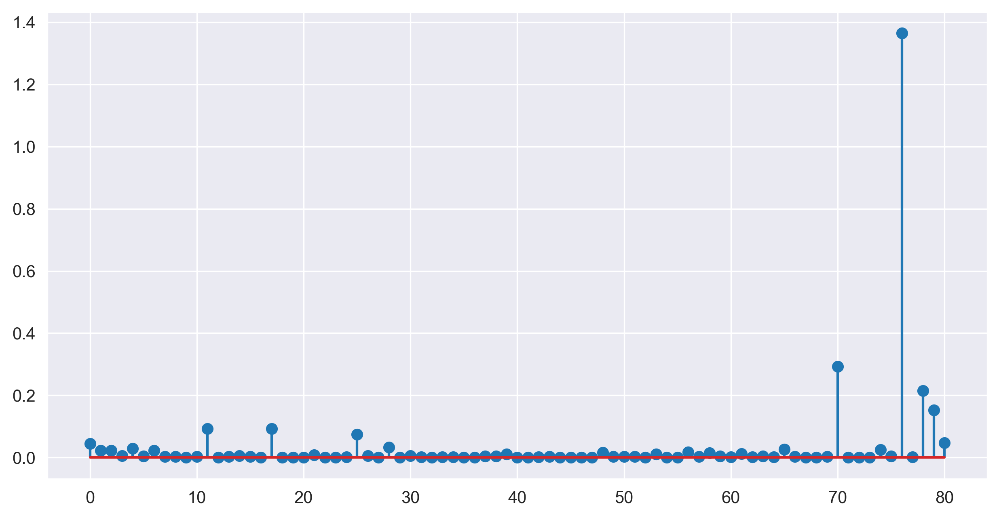

In [44]:
#cooks distance plot
plt.stem(c)

In [45]:
np.argmax(c),np.max(c)

(76, 1.3641743869103349)

In [46]:
#to get 76th row from dataset
df.iloc[[76]]

,HP,MPG,VOL,SP,WT
76,322,36.9,50,169.598513,16.132947


In [47]:
#influence plot
from statsmodels.graphics.regressionplots import influence_plot

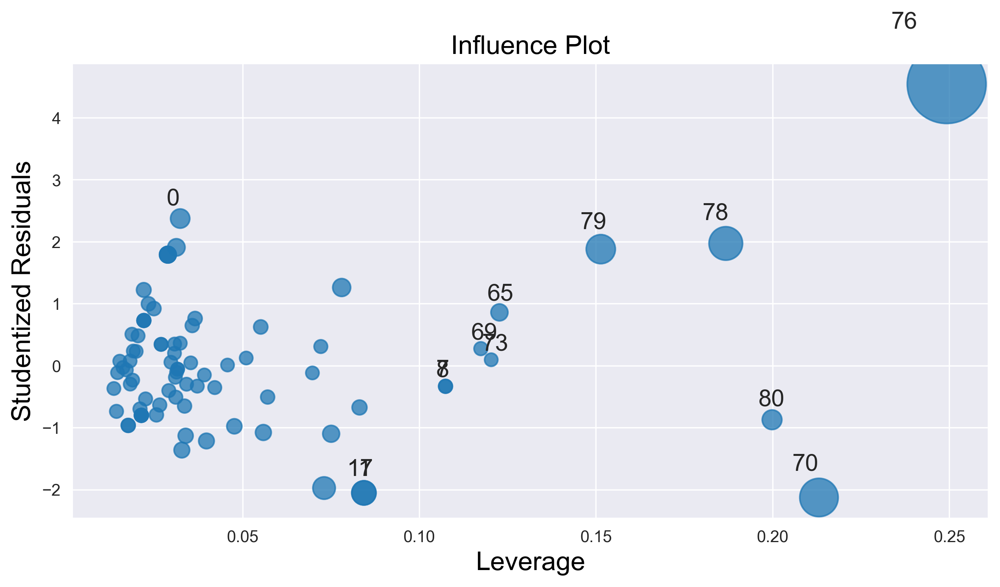

In [48]:
influence_plot(model);

In [49]:
#calculate cutoff
k=len(df.columns)
n=len(df)
lv=3*(k+1)/n
lv

0.2222222222222222

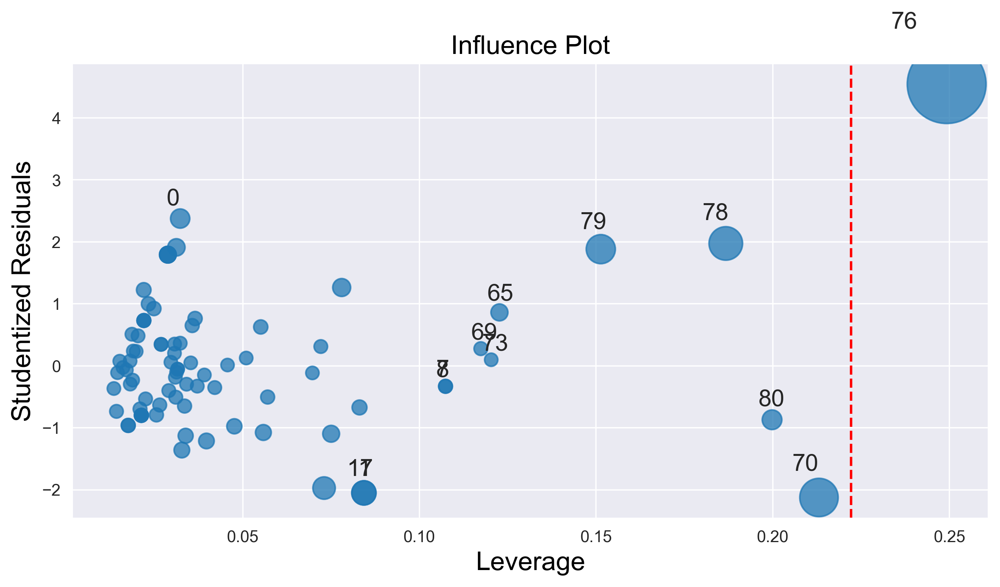

In [50]:
influence_plot(model)
plt.axvline(lv,linestyle='--',color='red')

# Improving the model

In [51]:
df.drop(index=76,inplace=True)

In [52]:
df

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
75,175,18.762837,129,132.864163,42.778219
77,238,19.197888,115,150.576579,37.923113
78,263,34.000000,50,151.598513,15.769625
79,295,19.833733,119,167.944460,39.423099


In [53]:
#reset the index

In [54]:
df.reset_index(inplace=True)

In [55]:
df

,index,HP,MPG,VOL,SP,WT
0,0,49,53.700681,89,104.185353,28.762059
1,1,55,50.013401,92,105.461264,30.466833
2,2,55,50.013401,92,105.461264,30.193597
3,3,70,45.696322,92,113.461264,30.632114
4,4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...,...
75,75,175,18.762837,129,132.864163,42.778219
76,77,238,19.197888,115,150.576579,37.923113
77,78,263,34.000000,50,151.598513,15.769625
78,79,295,19.833733,119,167.944460,39.423099


In [56]:
df.drop(columns=['index'],inplace=True)

In [57]:
df

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149
...,...,...,...,...,...
75,175,18.762837,129,132.864163,42.778219
76,238,19.197888,115,150.576579,37.923113
77,263,34.000000,50,151.598513,15.769625
78,295,19.833733,119,167.944460,39.423099


In [58]:
final_model=smf.ols('MPG~HP+VOL+SP',data=df).fit()

In [59]:
final_model.rsquared

0.8192122305013384

In [60]:
#cook's distance plot

#find the influence data
inf1=final_model.get_influence()

#calculate the cooks distance
c1,p1=inf1.cooks_distance

<StemContainer object of 3 artists>

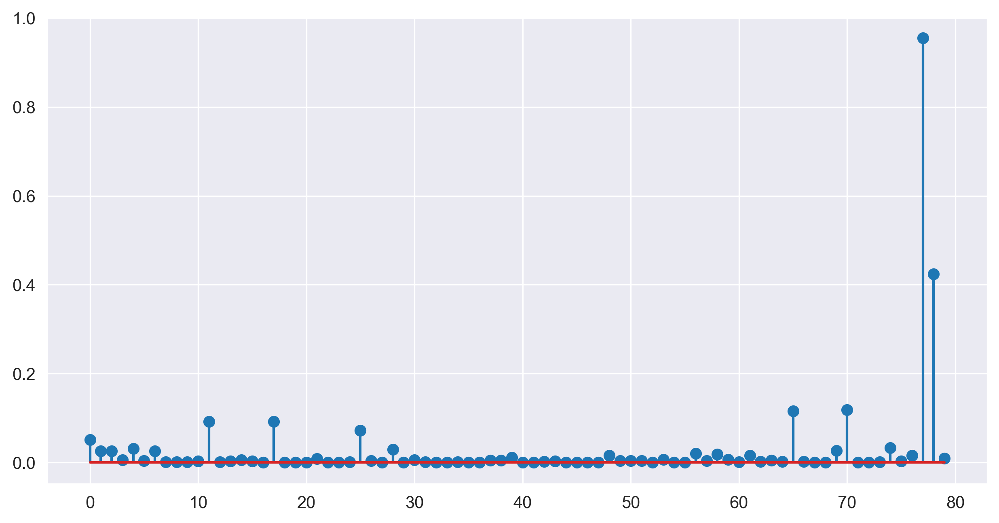

In [61]:
#cooks distance plot
plt.stem(c1)

# Predicting for new records

In [62]:
df.head()

,HP,MPG,VOL,SP,WT
0,49,53.700681,89,104.185353,28.762059
1,55,50.013401,92,105.461264,30.466833
2,55,50.013401,92,105.461264,30.193597
3,70,45.696322,92,113.461264,30.632114
4,53,50.504232,92,104.461264,29.889149


In [63]:
test=pd.DataFrame({
    'HP':[56,53.62,95],
    'VOL':[92.6,85.63,75],
    'SP':[110,112,150]
})

In [64]:
final_model.predict(test)

0    44.410251
1    46.979473
2    55.103295
dtype: float64

# inclass activity

In [65]:
df1=pd.read_csv('Toyoto_Corrola.csv')

In [66]:
df1.dtypes

Id            int64
Model        object
Price         int64
Age_08_04     int64
KM            int64
HP            int64
Doors         int64
Cylinders     int64
Gears         int64
Weight        int64
dtype: object

In [67]:
df1.head()

,Id,Model,Price,Age_08_04,KM,HP,Doors,Cylinders,Gears,Weight
0,1,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13500,23,46986,90,3,4,5,1165
1,2,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13750,23,72937,90,3,4,5,1165
2,3,ÊTOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,13950,24,41711,90,3,4,5,1165
3,4,TOYOTA Corolla 2.0 D4D HATCHB TERRA 2/3-Doors,14950,26,48000,90,3,4,5,1165
4,5,TOYOTA Corolla 2.0 D4D HATCHB SOL 2/3-Doors,13750,30,38500,90,3,4,5,1170


In [68]:
df1.drop(columns=['Id'],inplace=True)
df1.drop(columns=['Model'],inplace=True)

In [69]:
df1

,Price,Age_08_04,KM,HP,Doors,Cylinders,Gears,Weight
0,13500,23,46986,90,3,4,5,1165
1,13750,23,72937,90,3,4,5,1165
2,13950,24,41711,90,3,4,5,1165
3,14950,26,48000,90,3,4,5,1165
4,13750,30,38500,90,3,4,5,1170
...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,3,4,5,1025
1432,10845,72,19000,86,3,4,5,1015
1433,8500,71,17016,86,3,4,5,1015
1434,7250,70,16916,86,3,4,5,1015


In [70]:
df1.describe()

,Price,Age_08_04,KM,HP,Doors,Cylinders,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.0,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,4.033426,4.0,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.952677,0.0,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,2.000000,4.0,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,3.000000,4.0,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,4.000000,4.0,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,5.000000,4.0,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,5.000000,4.0,6.000000,1615.00000


In [71]:
df1.drop(columns=['Cylinders'],inplace=True)

In [72]:
df1.describe()

,Price,Age_08_04,KM,HP,Doors,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,4.033426,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.952677,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,2.000000,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,3.000000,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,4.000000,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,5.000000,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,5.000000,6.000000,1615.00000


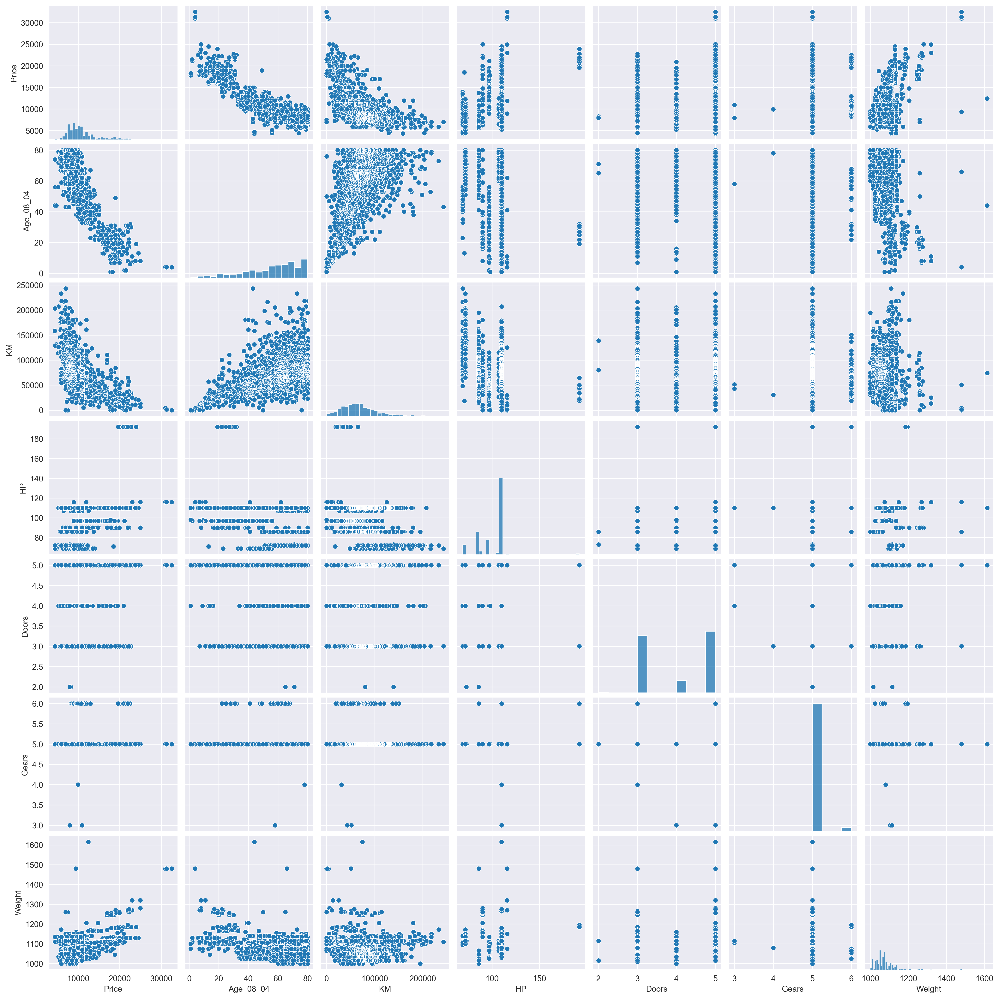

In [73]:
sns.pairplot(df1)

<Axes: >

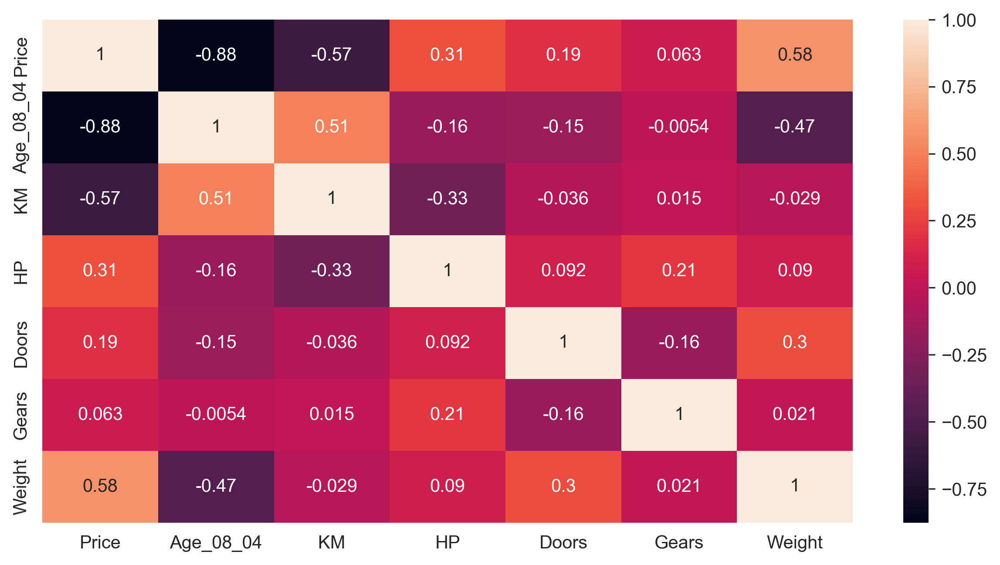

In [74]:
sns.heatmap(df1.corr(),annot=True)

# model building

In [75]:
df1.dtypes

Price        int64
Age_08_04    int64
KM           int64
HP           int64
Doors        int64
Gears        int64
Weight       int64
dtype: object

In [76]:
model1=smf.ols('Price~Age_08_04+KM+HP+Doors+Gears+Weight',data=df1).fit()

In [77]:
model1.pvalues.round(2)

Intercept    0.00
Age_08_04    0.00
KM           0.00
HP           0.00
Doors        0.81
Gears        0.00
Weight       0.00
dtype: float64

In [78]:
#has we can see pvalue for doors is more than aplha value(0.05) we have to remove it

In [79]:
df1.drop(columns=['Doors'],inplace=True)

In [80]:
model2=smf.ols('Price~Age_08_04+KM+HP+Gears+Weight',data=df1).fit()

In [81]:
model2.pvalues.round(2)

Intercept    0.0
Age_08_04    0.0
KM           0.0
HP           0.0
Gears        0.0
Weight       0.0
dtype: float64

In [82]:
model2.params

Intercept   -7006.827227
Age_08_04    -122.243676
KM             -0.019996
HP             28.282948
Gears         631.543519
Weight         18.557373
dtype: float64

# model validation

# 1.Residual Analysis
# Q-Q plot
To check normality of errors

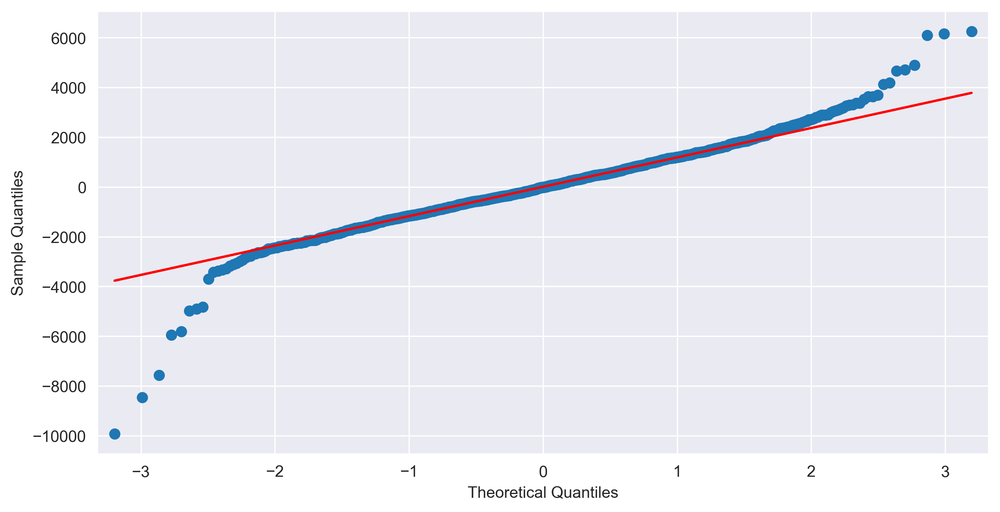

In [83]:
sm.qqplot(model2.resid,line='q');

# 2. Residual plot of homoscedasticity
To check to check if there is any pattern

<Axes: >

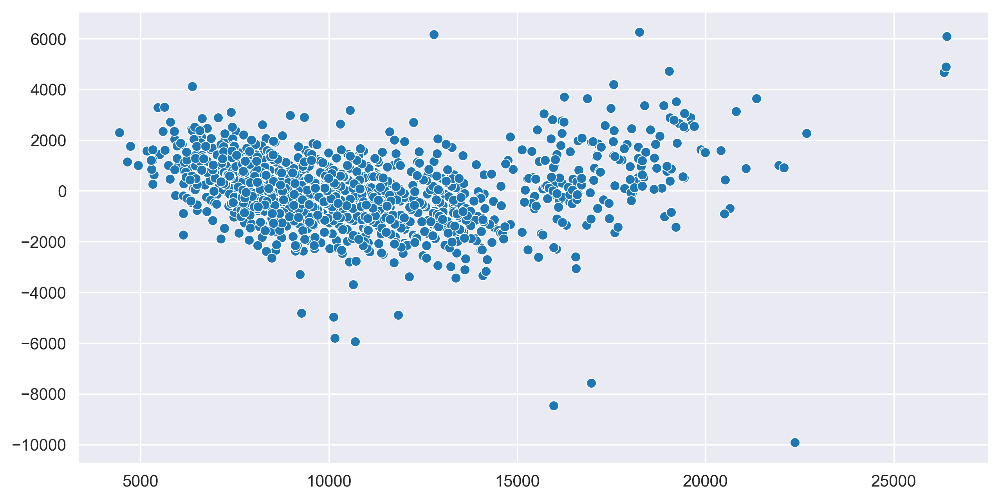

In [84]:
sns.scatterplot(x=model2.fittedvalues,y=model2.resid)

# 3.Residual vs Regressor
Weather erros are independent of our features

In [85]:
df1.head()

,Price,Age_08_04,KM,HP,Gears,Weight
0,13500,23,46986,90,5,1165
1,13750,23,72937,90,5,1165
2,13950,24,41711,90,5,1165
3,14950,26,48000,90,5,1165
4,13750,30,38500,90,5,1170


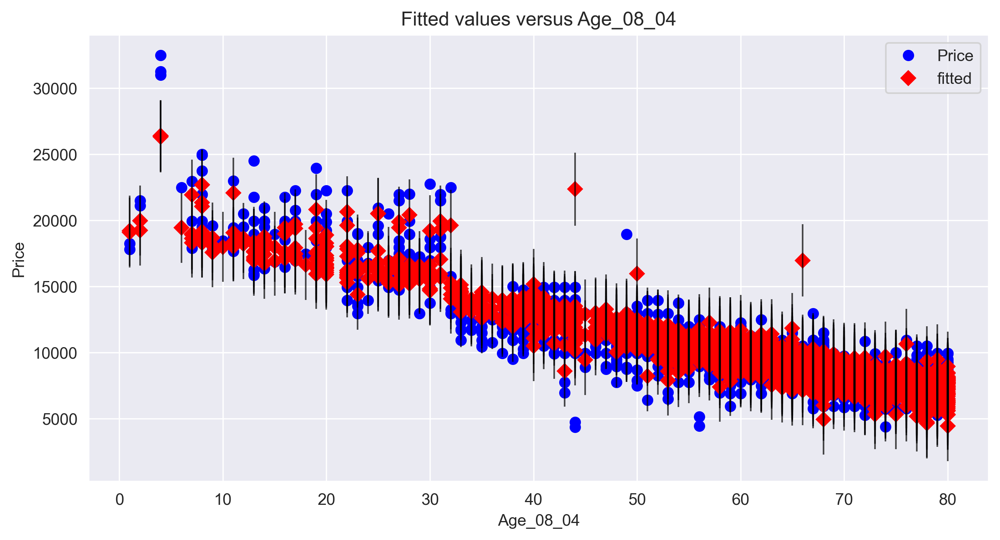

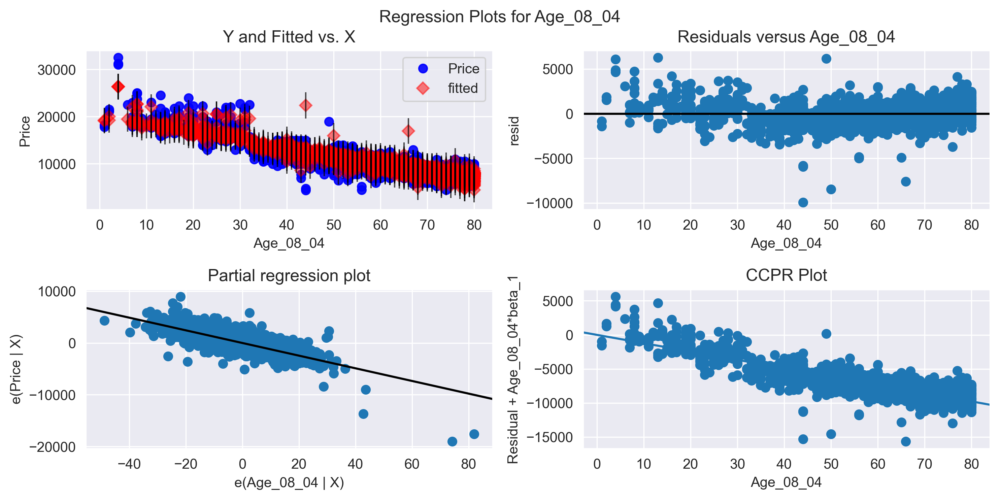

In [86]:
#Age_08_04
sm.graphics.plot_fit(model2,'Age_08_04');
sm.graphics.plot_regress_exog(model2,'Age_08_04');

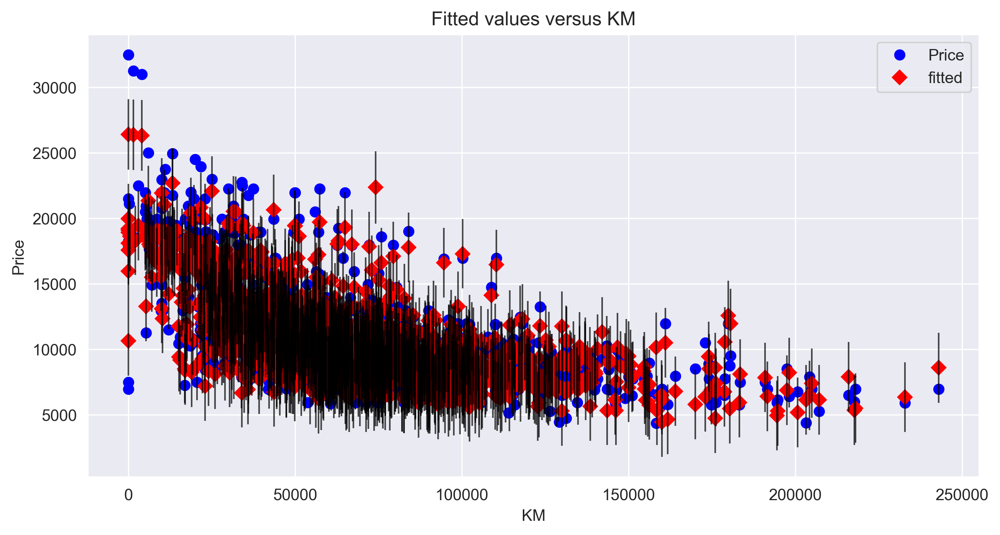

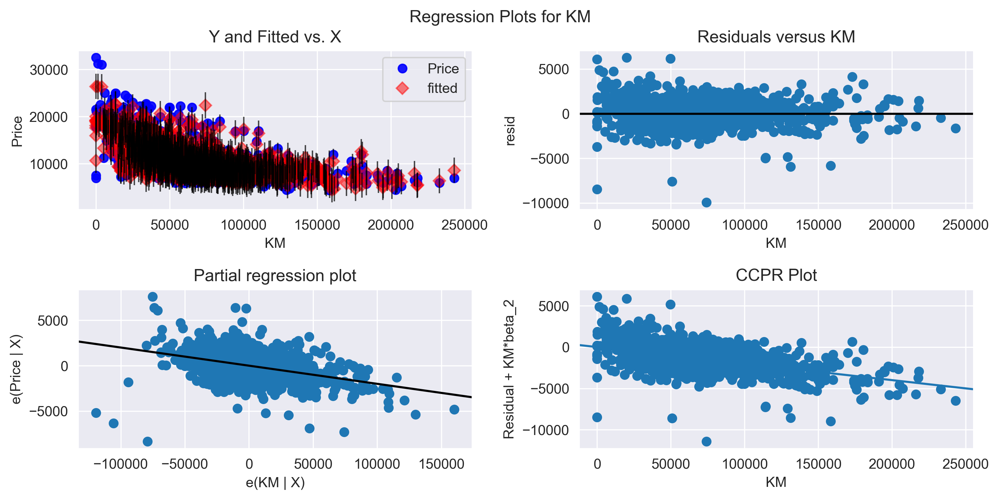

In [87]:
#KM
sm.graphics.plot_fit(model2,'KM');
sm.graphics.plot_regress_exog(model2,'KM');

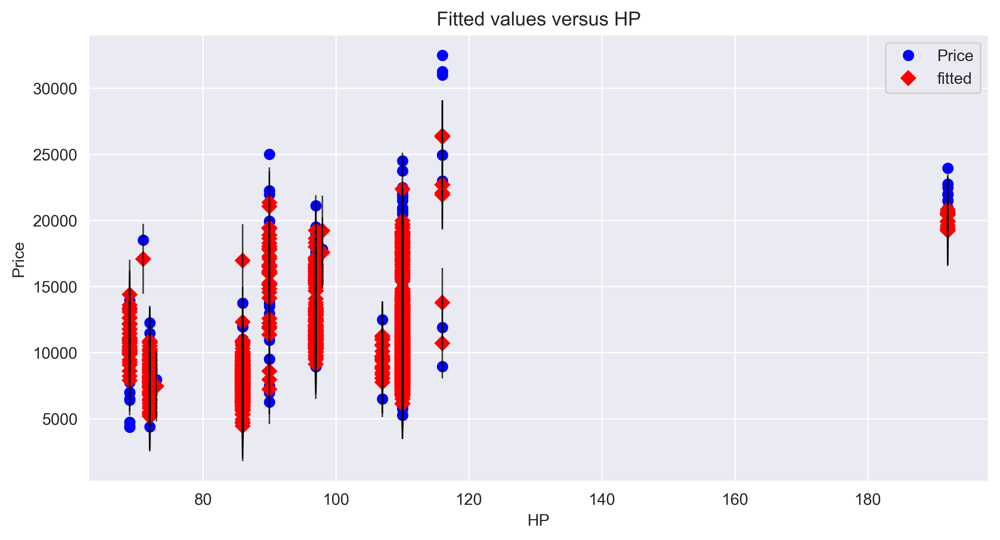

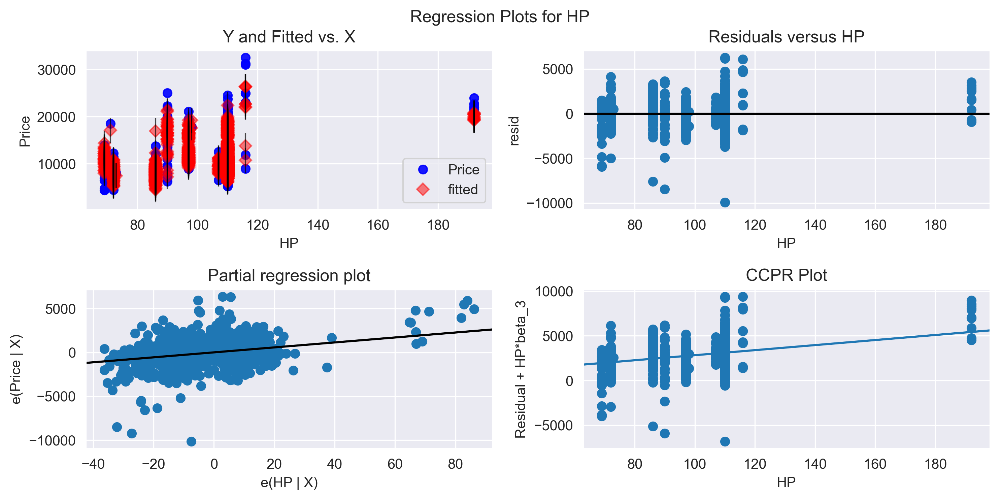

In [88]:
#HP
sm.graphics.plot_fit(model2,'HP');
sm.graphics.plot_regress_exog(model2,'HP');

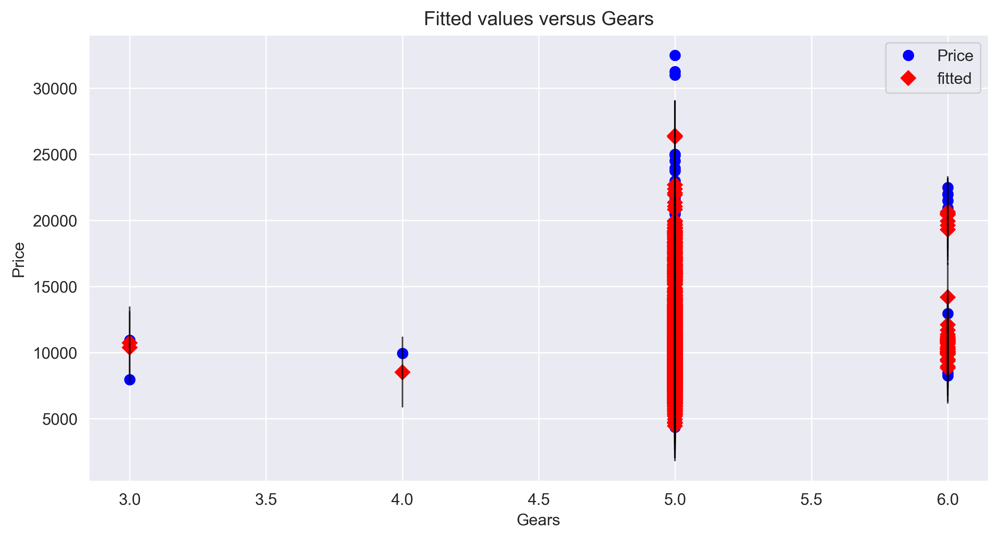

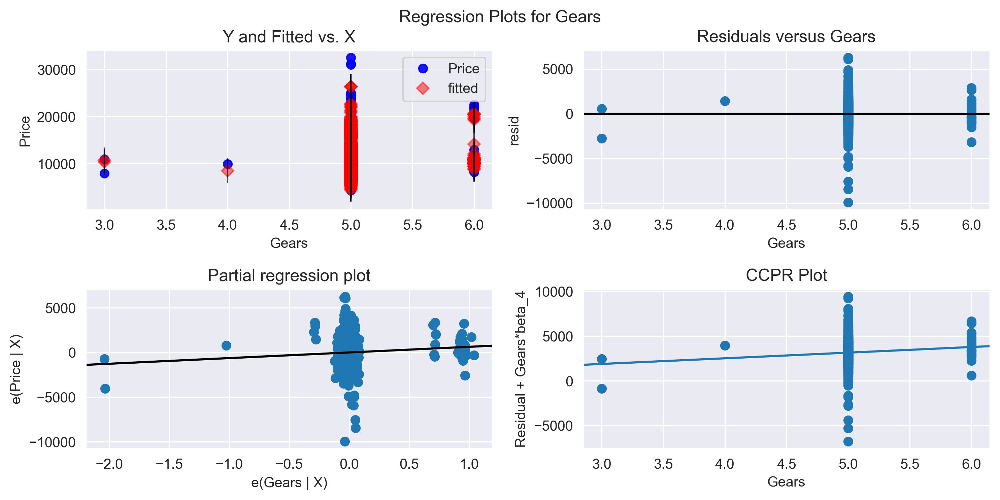

In [89]:
#Gears
sm.graphics.plot_fit(model2,'Gears');
sm.graphics.plot_regress_exog(model2,'Gears');

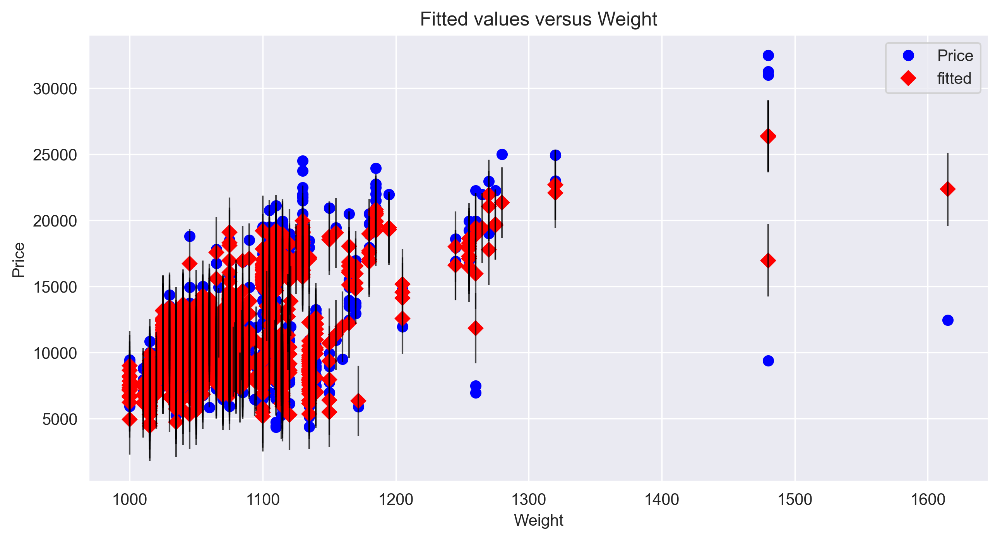

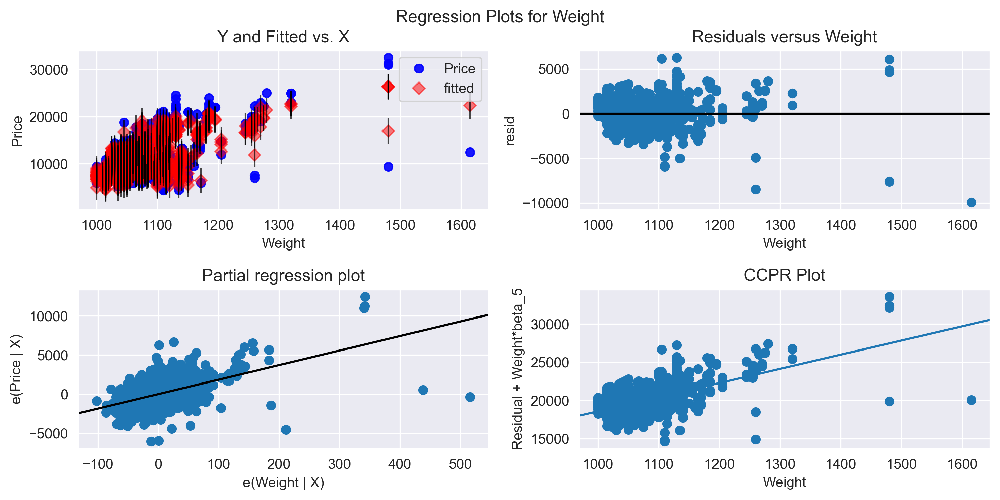

In [90]:
#Weight
sm.graphics.plot_fit(model2,'Weight');
sm.graphics.plot_regress_exog(model2,'Weight');

# model deletion

In [91]:
#cooks distance
#find the influence data
inf2=model2.get_influence()

#calculate the cooks distance
c2,p2=inf2.cooks_distance

<StemContainer object of 3 artists>

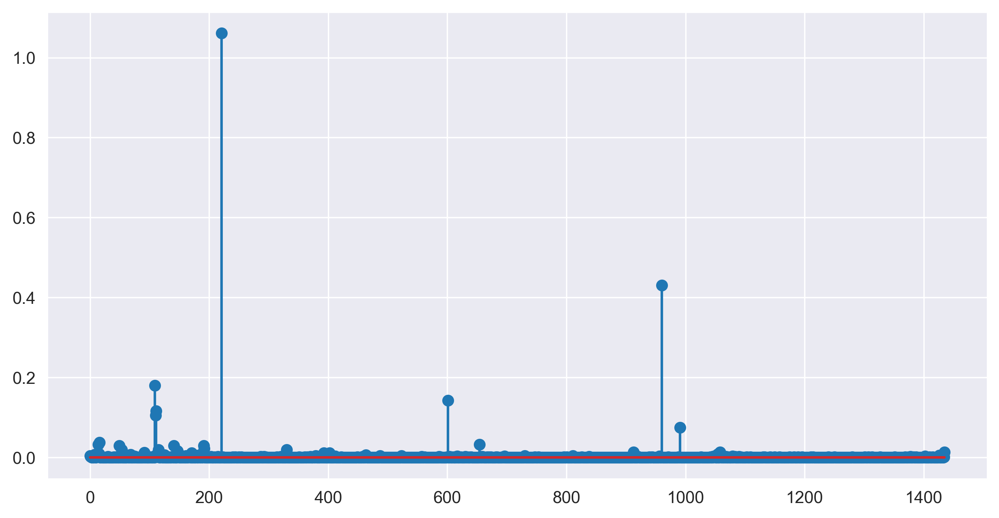

In [92]:
#cooks distance plot
plt.stem(c2)

In [93]:
np.argmax(c2),np.max(c2)

(221, 1.0607870279723672)

In [94]:
#to get 221th row from dataset
df1.iloc[[221]]

,Price,Age_08_04,KM,HP,Gears,Weight
221,12450,44,74172,110,5,1615


In [95]:
#improving the model2

In [96]:
df1.drop(index=221,inplace=True)

In [97]:
df1.dtypes

Price        int64
Age_08_04    int64
KM           int64
HP           int64
Gears        int64
Weight       int64
dtype: object

In [98]:
final_model2=smf.ols('Price~Age_08_04+KM+HP+Gears+Weight',data=df1).fit()

In [99]:
model2.rsquared.round(2),final_model2.rsquared.round(2)

(0.86, 0.87)